In [8]:
import os

import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt
from scipy.integrate import odeint
from statsmodels.tsa.stattools import adfuller
from statsmodels.graphics.tsaplots import plot_acf, plot_pacf
from statsmodels.tsa.arima_model import ARIMA


In [9]:
# DATA
URL = "https://raw.githubusercontent.com/CSSEGISandData/COVID-19/master/csse_covid_19_data/csse_covid_19_time_series/"
CONFIRMED="time_series_covid19_confirmed_global.csv" 
DEATH="time_series_covid19_deaths_global.csv"
RECOVERED="time_series_covid19_recovered_global.csv"

In [10]:
def cases(csv, name):
    # load dataset
    df = csv.copy()
    #print(df.head())

    # select only time series parts
    df = df.iloc[:, 4:]

    # check missing values
    if df.isnull().sum().sum():
        print("There are missing values, do some thing with them.")

    # get number of cases of the day
    cases = df.sum(axis=0)

    # show graph of confirmed cases
    plt.plot(cases)
    plt.title(name+" cases")
    plt.xticks(rotation=90)
    plt.show()

    # get only number of new cases of the day
    daily_cases = cases.diff().fillna(cases[0]).astype(np.int64)

    # show graph of daily confirmed cases
    plt.plot(daily_cases)
    plt.title("daily "+name+" cases")
    plt.xticks(rotation=90)
    plt.show()

    # show graph of daily and total of the day
    plt.plot(cases, label="Total cases")
    plt.plot(daily_cases, label="Daily cases")
    plt.title("Daily and total "+name+" cases")
    plt.xticks(rotation=90)
    plt.legend()
    plt.show()
    return cases

def is_stationary(total_cases):
    ''' ARIMA model '''
    # I've adapted code from original source: https://towardsdatascience.com/arima-forecasting-in-python-90d36c2246d3,
    # https://medium.com/@josemarcialportilla/using-python-and-auto-arima-to-forecast-seasonal-time-series-90877adff03c
    # https://towardsdatascience.com/machine-learning-part-19-time-series-and-autoregressive-integrated-moving-average-model-arima-c1005347b0d7
    # https://www.machinelearningplus.com/time-series/arima-model-time-series-forecasting-python/
    # and https://www.statsmodels.org/stable/tsa.html

    SIGNIFICANCE = 0.05

    rolling_mean = total_cases.rolling(window = 7).mean()
    rolling_std = total_cases.rolling(window = 7).std()
    plt.plot(total_cases, color = 'blue', label = 'Original')
    plt.plot(rolling_mean, color = 'red', label = 'Rolling Mean')
    plt.plot(rolling_std, color = 'black', label = 'Rolling Std')
    plt.legend(loc = 'best')
    plt.title('Rolling Mean & Rolling Standard Deviation')
    plt.xticks(rotation=90)
    plt.tight_layout()
    plt.show()

    result = adfuller(total_cases)
    print('ADF Statistic: {}'.format(result[0]))
    print('p-value: {}'.format(result[1]))
    print('Critical Values:')
    for key, value in result[4].items():
        print('\t{}: {}'.format(key, value))

    # let's calculate p-value to check if the timeseries is stationary
    if result[1] >= SIGNIFICANCE:
        print("This time-series is not stationary, d>0")
    else:
        print("This time-series is stationary, d=0")
        
def find_order(total_cases, partial=True):
    if not partial:
        fig = plt.figure(figsize=(10, 10))

        ax1 = fig.add_subplot(311)
        fig = plot_acf(total_cases, ax=ax1,
                       title="Prtial Autocorrelation on Original Series") 
        ax2 = fig.add_subplot(312)
        fig = plot_acf(total_cases.diff().dropna(), ax=ax2, 
                       title="1st Order Differencing")

        ax3 = fig.add_subplot(313)
        fig = plot_acf(total_cases.diff().diff().dropna(), ax=ax3, 
                       title="2nd Order Differencing")

    else:
        fig = plt.figure(figsize=(10, 10))

        ax1 = fig.add_subplot(311)
        fig = plot_pacf(total_cases, ax=ax1,
                       title="Prtial Autocorrelation on Original Series") 
        ax2 = fig.add_subplot(312)
        fig = plot_pacf(total_cases.diff().dropna(), ax=ax2, 
                       title="1st Order Differencing")

        ax3 = fig.add_subplot(313)
        fig = plot_pacf(total_cases.diff().diff().dropna(), ax=ax3, 
                       title="2nd Order Differencing")
        
def acf(total_cases):
    fig = plt.figure(figsize=(20, 10))

    ax1 = fig.add_subplot(321)
    fig = plot_acf(total_cases, ax=ax1,
                   title="Autocorrelation on Original Series") 
    ax2 = fig.add_subplot(322)
    ax2.plot(total_cases)
    ax2.set_title("Autocorrelation on Original Series")
    plt.xticks(rotation=90)

    ax3 = fig.add_subplot(323)
    fig = plot_acf(total_cases.diff().dropna(), ax=ax3, 
                   title="1st Order Differencing")
    ax4 = fig.add_subplot(324)
    ax4.plot(total_cases.diff().dropna())
    ax4.set_title("1st Order Differencing")
    plt.xticks(rotation=90)

    ax5 = fig.add_subplot(325)
    fig = plot_acf(total_cases.diff().diff().dropna(), ax=ax5, 
                   title="2nd Order Differencing")
    ax6 = fig.add_subplot(326)
    ax6.plot(total_cases.diff().diff().dropna())
    ax6.set_title("2nd Order Differencing")
    plt.xticks(rotation=90)
    
def pacf(total_cases):
    fig = plt.figure(figsize=(20, 10))

    ax1 = fig.add_subplot(321)
    fig = plot_pacf(total_cases, ax=ax1,
                   title="Partial Autocorrelation on Original Series") 
    ax2 = fig.add_subplot(322)
    ax2.plot(total_cases)
    ax2.set_title("Partial Autocorrelation on Original Series")
    plt.xticks(rotation=90)

    ax3 = fig.add_subplot(323)
    fig = plot_pacf(total_cases.diff().dropna(), ax=ax3, 
                   title="1st Order Differencing")
    ax4 = fig.add_subplot(324)
    ax4.plot(total_cases.diff().dropna())
    ax4.set_title("1st Order Differencing")
    plt.xticks(rotation=90)

    ax5 = fig.add_subplot(325)
    fig = plot_pacf(total_cases.diff().diff().dropna(), ax=ax5, 
                   title="2nd Order Differencing")
    ax6 = fig.add_subplot(326)
    ax6.plot(total_cases.diff().diff().dropna())
    ax6.set_title("2nd Order Differencing")
    plt.xticks(rotation=90)
    

def pdq_analysis(total_cases):
    # Find the order of differencing, d:
    print("WARNING!:  if the lag 1 autocorrelation itself is too negative, then the series is probably over-differenced.")
    print("Finding the order of differencing (d) in ARIMA model")
    acf(total_cases)
    
    # Find the order of the MA, q:
    print("Finding the order of the MA term (q)")
    #acf(total_cases)
        
    # Find the order of AR; p
    print("Finding the order of the AR term (p)")
    pacf(total_cases)
    
    
def build_arima(total_cases, name, order): 
    # future
    DAYS_TO_PREDICT = 42+28
    model = ARIMA(total_cases, order=order)
    results = model.fit(disp=0)
    print(results.summary())
    
    residuals = pd.DataFrame(results.resid)
    fig, ax = plt.subplots(1,2)
    residuals.plot(title="Residuals", ax=ax[0])
    residuals.plot(kind='kde', title='Density', ax=ax[1])
    plt.show()
    
    figure = results.plot_predict(1, TOTAL_DAYS+DAYS_TO_PREDICT, dynamic=False)
    plt.title(f"ARIMA model for predition {name} cases (future)")
    plt.show()
    
    fc, _, _ = results.forecast(DAYS_TO_PREDICT, alpha=0.05)
    return fc
    
def build_arima_valiadation(total_cases, name, order):
    # validation
    model = ARIMA(total_cases[:-TEST_SIZE], order=order)
    results = model.fit(disp=0)
    print(results.summary())
    fc, se, conf = results.forecast(TEST_SIZE, alpha=0.05)  # 95% conf
    fc_series = pd.Series(fc, index=total_cases[-TEST_SIZE:].index)
    lower_series = pd.Series(conf[:, 0], index=total_cases[-TEST_SIZE:].index)
    upper_series = pd.Series(conf[:, 1], index=total_cases[-TEST_SIZE:].index)
    plt.figure(figsize=(12,5), dpi=100)
    plt.plot(total_cases[:-TEST_SIZE], label='training')
    plt.plot(total_cases[-TEST_SIZE:], label='actual')
    plt.plot(fc_series, label='forecast')
    plt.fill_between(lower_series.index, lower_series, upper_series, 
                     color='k', alpha=.15)
    plt.title(f'ARIMA model for predition {name} cases (validation)')
    plt.legend(loc='upper left', fontsize=8)
    plt.show()
    return fc
    
def arima(time_series_data=[], validation_predicted_cases=[], predicted_cases=[]):
    time_series = time_series_data[0] - time_series_data[1] - time_series_data[2]
    validation_cases = validation_predicted_cases[0] - validation_predicted_cases[1] - validation_predicted_cases[2]
    future_cases = predicted_cases[0] - predicted_cases[1] - predicted_cases[2]
    # plot validation graph
    plt.plot(time_series[-TEST_SIZE:]/1000000, label="Real cases")
    plt.plot(validation_cases/1000000, label="Predicted cases")
    plt.ylabel('Number (millionth)')
    plt.xlabel("14 days ago to now")
    plt.title("ARIMA model for prediction infected cases (validation)")
    plt.xticks(rotation=90)
    plt.legend()
    plt.tight_layout()
    plt.show()

    # plot prediction graph
    DAYS_TO_PREDICT = 42 + 28
    t = np.linspace(0, DAYS_TO_PREDICT, DAYS_TO_PREDICT)
    plt.plot(t, future_cases/1000000, label='Predicted Cases')
    plt.xlabel("days from now")
    plt.ylabel('Number (millionth)')
    plt.title("ARIMA model for prediction infected cases (future)")
    plt.legend()
    plt.tight_layout()
    plt.show()


In [11]:
confirmed_case = pd.read_csv(os.path.join(URL, CONFIRMED))
death_case = pd.read_csv(os.path.join(URL, DEATH))
recovered_case = pd.read_csv(os.path.join(URL, RECOVERED))
confirmed_thai = confirmed_case.loc[confirmed_case['Country/Region']=='Thailand']
death_thai = death_case.loc[death_case['Country/Region']=='Thailand']
recovered_thai = recovered_case.loc[recovered_case['Country/Region']=='Thailand']
del confirmed_case, death_case, recovered_case

In [12]:
# Set train and test in Mathematical, Statistical and Machine learning model
temp_time_series_csv = confirmed_thai.iloc[:, 4:].sum(axis=0)
TOTAL_DAYS = int(temp_time_series_csv.shape[0])
print(u"The number of days in the time-series data is {}.".format(TOTAL_DAYS))
## set test size is 14 days
TEST_SIZE = 14
TRAIN_SIZE = int(TOTAL_DAYS - TEST_SIZE)
print(u"We separate time-series data into 2 sets; Train and Test which their size are {} and {} respectively.".format(TRAIN_SIZE, TEST_SIZE))


The number of days in the time-series data is 553.
We separate time-series data into 2 sets; Train and Test which their size are 539 and 14 respectively.


In [13]:
population = 69988081
rate_of_brith = 0.25
reproductive_number = 2

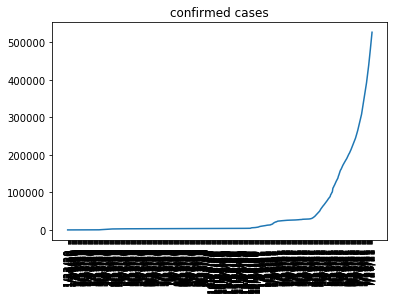

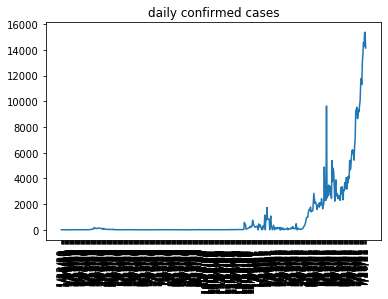

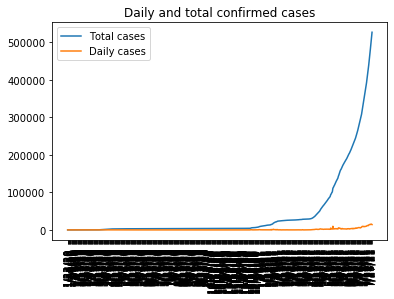

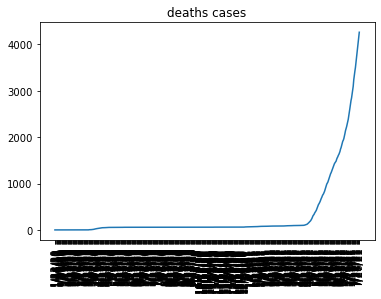

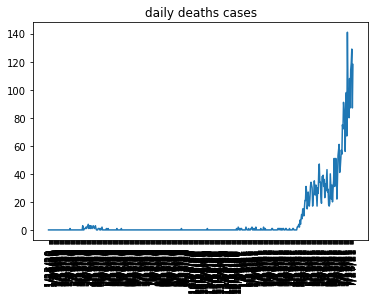

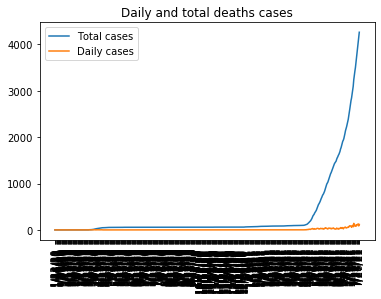

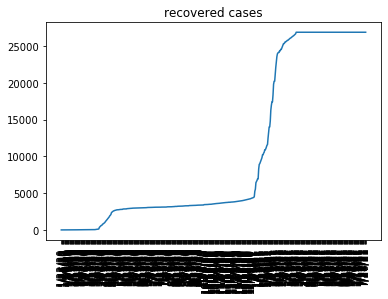

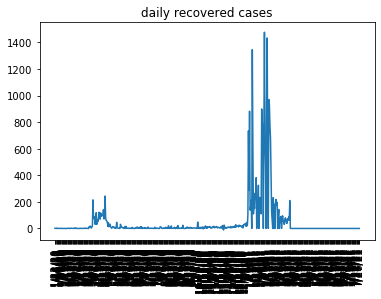

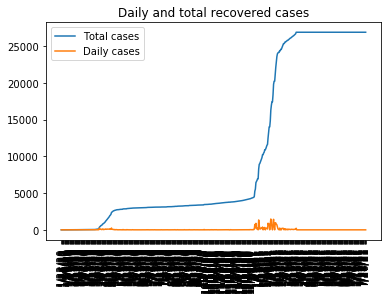

In [14]:
# statistical model; ARIMA model, a time-series model.
total_confirmed = cases(csv=confirmed_thai, name="confirmed")
total_death = cases(csv=death_thai, name="deaths")
total_recovered = cases(csv=recovered_thai, name="recovered")

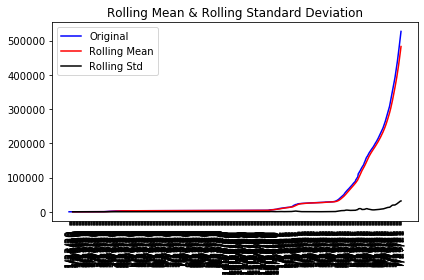

ADF Statistic: 4.573913362539061
p-value: 1.0
Critical Values:
	1%: -3.4426552678216003
	5%: -2.8669676577777548
	10%: -2.569660749624767
This time-series is not stationary, d>0
WARNING!:  if the lag 1 autocorrelation itself is too negative, then the series is probably over-differenced.
Finding the order of differencing (d) in ARIMA model
Finding the order of the MA term (q)
Finding the order of the AR term (p)
C:\Users\Dell\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\tsa\base\tsa_model.py:159: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\Dell\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\tsa\base\tsa_model.py:159: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
                             ARIMA Model Results                              
Dep. Varia

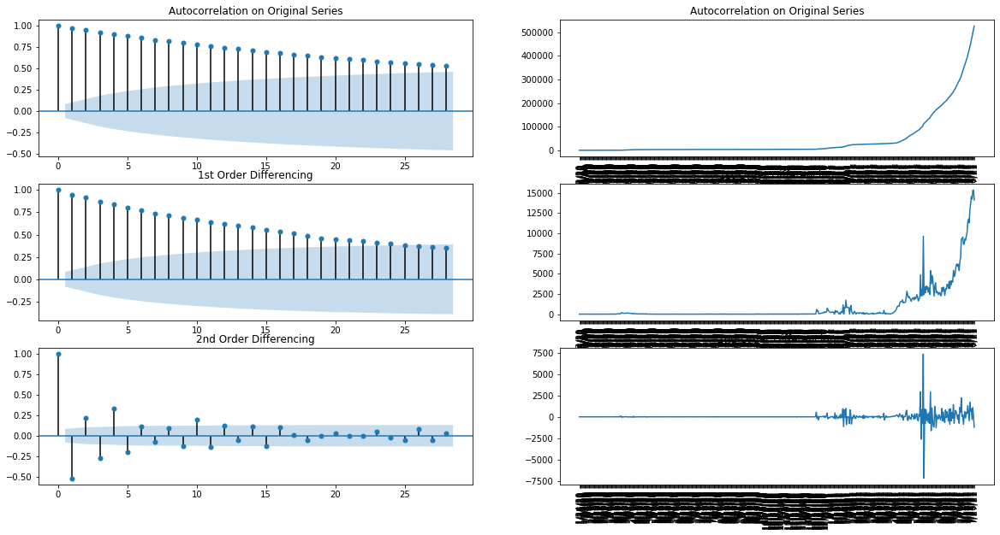

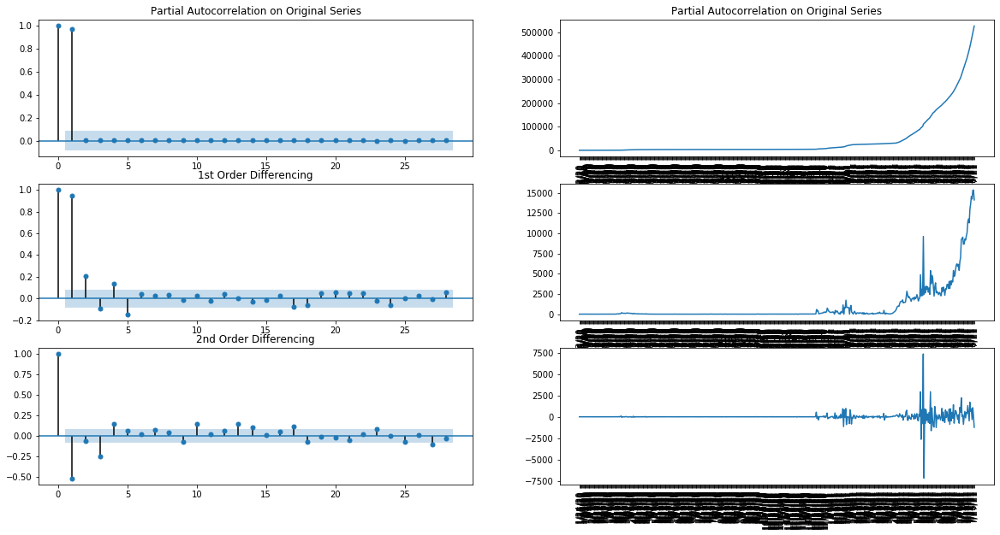

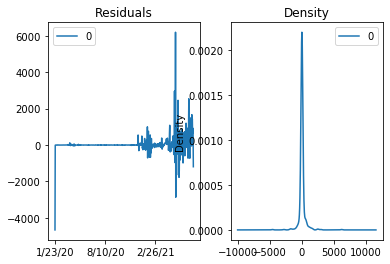

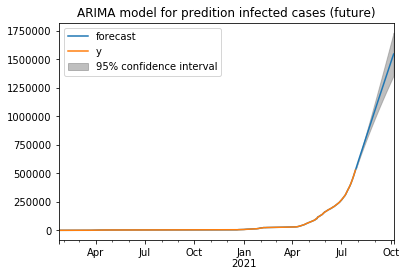

C:\Users\Dell\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\tsa\base\tsa_model.py:159: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\Dell\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\tsa\base\tsa_model.py:159: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                  538
Model:                 ARIMA(5, 1, 0)   Log Likelihood               -4045.346
Method:                       css-mle   S.D. of innovations            443.841
Date:                Wed, 28 Jul 2021   AIC                           8104.692
Time:                        20:05:34   BIC                           8134.707
Sample:                    01-

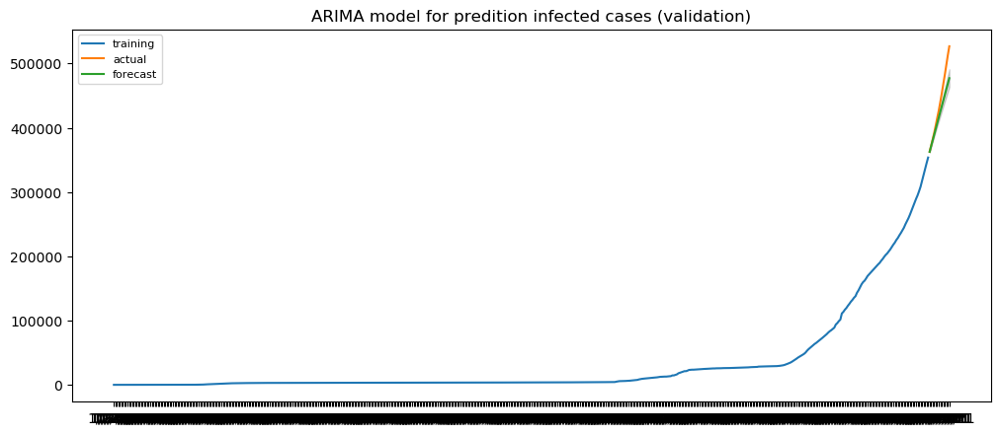

In [20]:
is_stationary(total_confirmed)
pdq_analysis(total_confirmed)
order = (5,1,0)
arima_confirmed = build_arima(total_cases=total_confirmed, name="confirmed", order=order)
arima_confirmed_validation = build_arima_valiadation(total_cases=total_confirmed, name="confirmed", order=order)

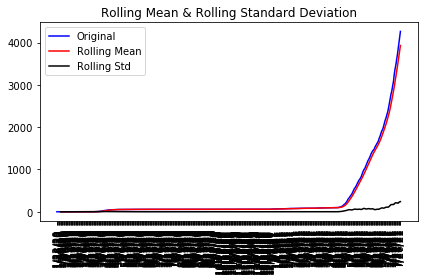

ADF Statistic: 5.2316355265364365
p-value: 1.0
Critical Values:
	1%: -3.442678467240966
	5%: -2.8669778698997543
	10%: -2.5696661916864083
This time-series is not stationary, d>0
WARNING!:  if the lag 1 autocorrelation itself is too negative, then the series is probably over-differenced.
Finding the order of differencing (d) in ARIMA model
Finding the order of the MA term (q)
Finding the order of the AR term (p)
C:\Users\Dell\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\tsa\base\tsa_model.py:159: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\Dell\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\tsa\base\tsa_model.py:159: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\Dell\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\base\

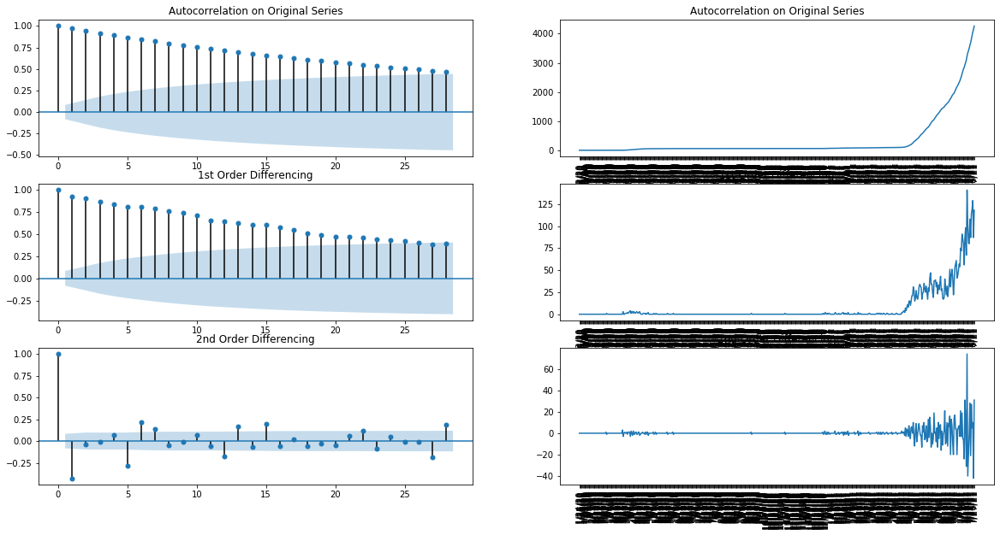

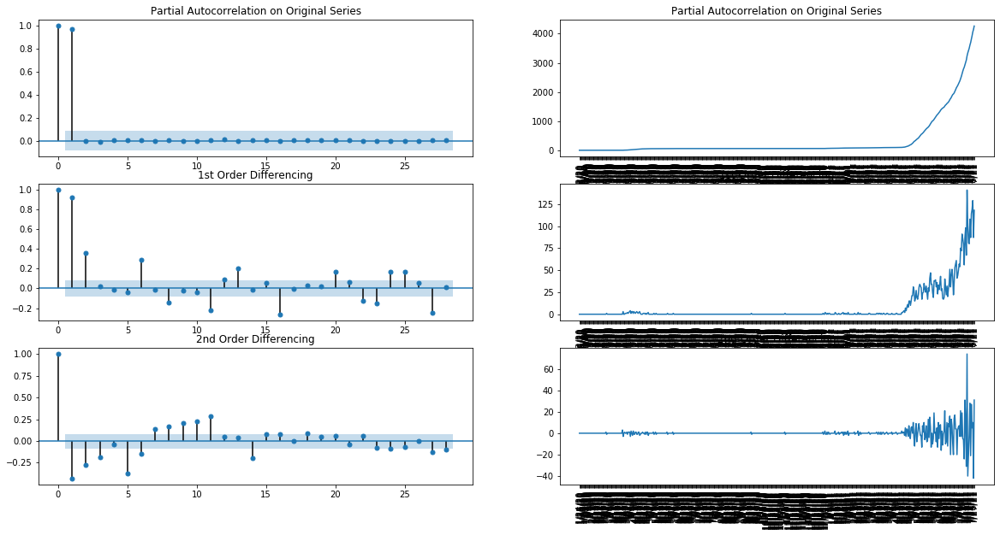

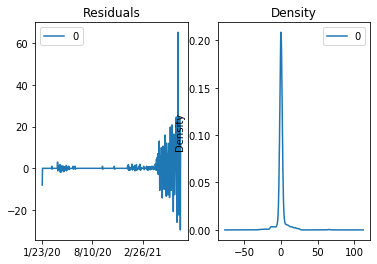

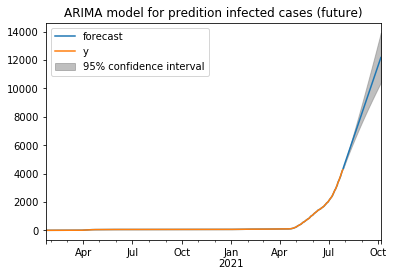

C:\Users\Dell\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\tsa\base\tsa_model.py:159: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\Dell\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\tsa\base\tsa_model.py:159: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                  538
Model:                 ARIMA(5, 1, 0)   Log Likelihood               -1462.750
Method:                       css-mle   S.D. of innovations              3.653
Date:                Wed, 28 Jul 2021   AIC                           2939.499
Time:                        20:08:15   BIC                           2969.514
Sample:                    01-

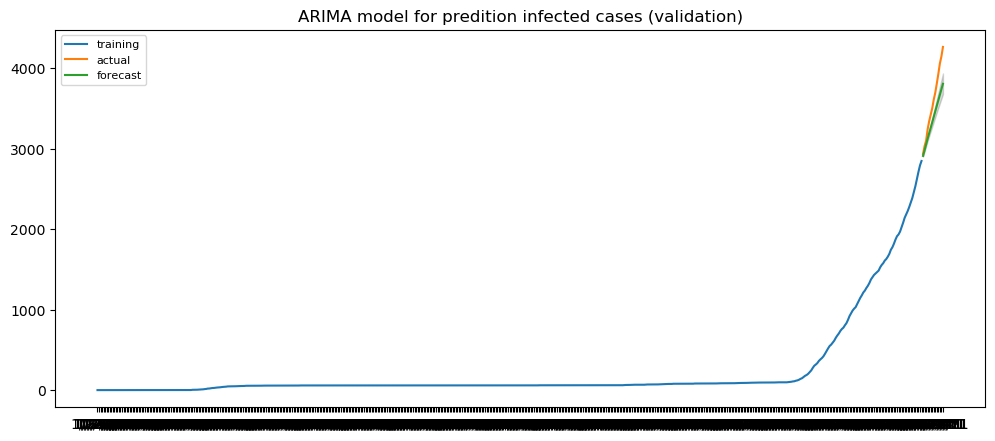

In [21]:
is_stationary(total_death)
pdq_analysis(total_death)
order = (5,1,0)
arima_death = build_arima(total_cases=total_death, name="deaths", order=order)
arima_death_validation = build_arima_valiadation(total_cases=total_death, name="deaths", order=order)

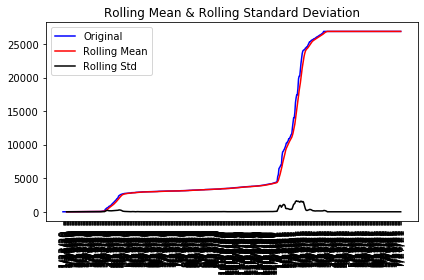

ADF Statistic: -0.7176555244454423
p-value: 0.8421232040929316
Critical Values:
	1%: -3.442383534871275
	5%: -2.8668480382580386
	10%: -2.569597004924258
This time-series is not stationary, d>0
WARNING!:  if the lag 1 autocorrelation itself is too negative, then the series is probably over-differenced.
Finding the order of differencing (d) in ARIMA model
Finding the order of the MA term (q)
Finding the order of the AR term (p)
C:\Users\Dell\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\tsa\base\tsa_model.py:159: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\Dell\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\tsa\base\tsa_model.py:159: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
                             ARIMA Model Results                         

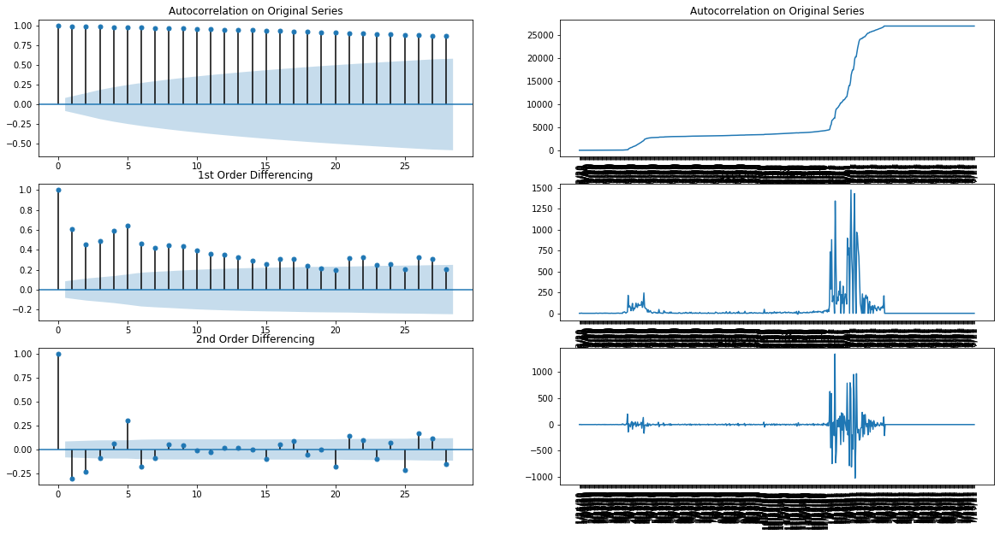

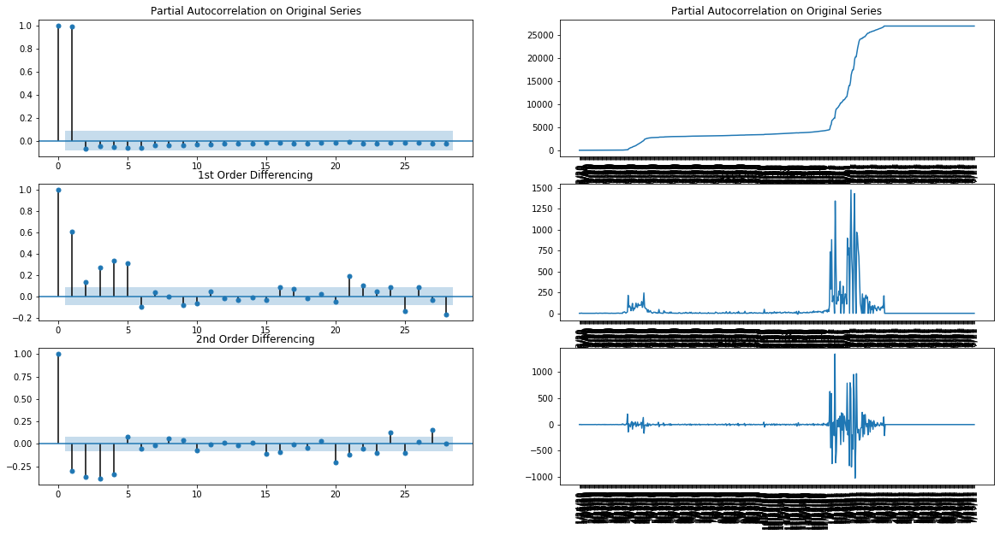

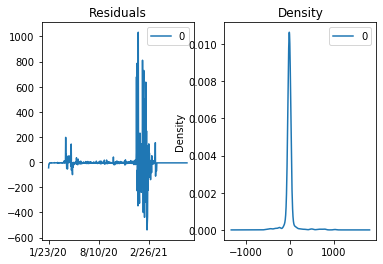

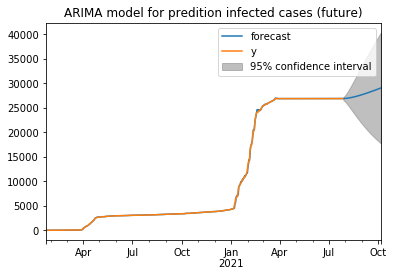

C:\Users\Dell\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\tsa\base\tsa_model.py:159: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
C:\Users\Dell\AppData\Local\Programs\Python\Python38\lib\site-packages\statsmodels\tsa\base\tsa_model.py:159: ValueWarning: No frequency information was provided, so inferred frequency D will be used.
  warnings.warn('No frequency information was'
                             ARIMA Model Results                              
Dep. Variable:                    D.y   No. Observations:                  538
Model:                 ARIMA(5, 1, 0)   Log Likelihood               -3315.470
Method:                       css-mle   S.D. of innovations            114.678
Date:                Wed, 28 Jul 2021   AIC                           6644.940
Time:                        20:10:34   BIC                           6674.955
Sample:                    01-

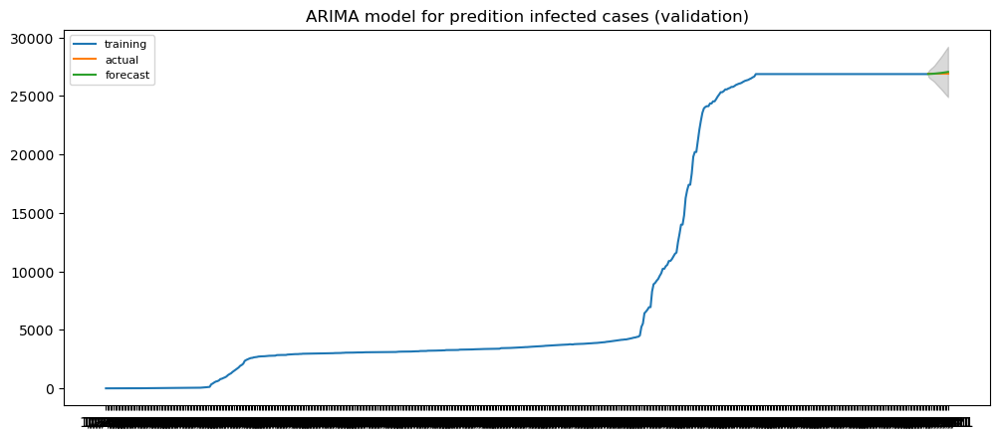

In [22]:
is_stationary(total_recovered)
pdq_analysis(total_recovered)
order = (5,1,0)
arima_recovered = build_arima(total_cases=total_recovered, name="recovered", order=order)
arima_recovered_validation = build_arima_valiadation(total_cases=total_recovered, name="recovered", order=order)

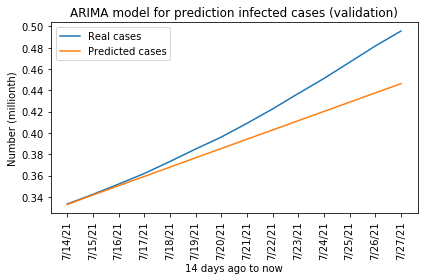

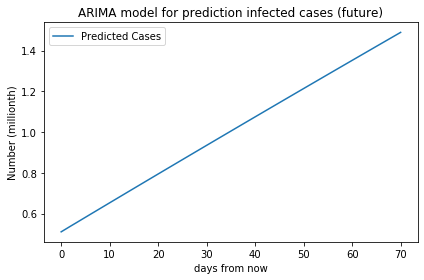

In [23]:
# build ARIMA model
arima(time_series_data=[total_confirmed, total_death, total_recovered], 
    validation_predicted_cases=[arima_confirmed_validation, arima_death_validation, arima_recovered_validation], 
    predicted_cases=[arima_confirmed, arima_death, arima_recovered])